In [ ]:
import tensorflow as tf
import matplotlib.image as img
%matplotlib inline
import numpy as np
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
import tensorflow as tfs
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np
import os
import random

# 1. EXTRACTING AND LOADING THE DATA


In [ ]:
import os
# Helper function to download data and extract
def get_data_extract():
  if "food-101" in os.listdir():
    print("Dataset already exists")
  else:
    print("Downloading the data...")
    !wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
    print("Dataset downloaded!")
    print("Extracting data..")
    !tar xzvf food-101.tar.gz
    print("Extraction done!")

In [ ]:
get_data_extract()

Streaming output truncated to the last 5000 lines.
food-101/images/cannoli/1767088.jpg
food-101/images/cannoli/3201965.jpg
food-101/images/cannoli/3778102.jpg
food-101/images/cannoli/2674065.jpg
food-101/images/cannoli/1169899.jpg
food-101/images/cannoli/1378086.jpg
food-101/images/cannoli/803909.jpg
food-101/images/cannoli/1067240.jpg
food-101/images/cannoli/3002709.jpg
food-101/images/cannoli/2612632.jpg
food-101/images/cannoli/3627612.jpg
food-101/images/cannoli/1798703.jpg
food-101/images/cannoli/560632.jpg
food-101/images/cannoli/512468.jpg
food-101/images/cannoli/2331523.jpg
food-101/images/cannoli/3118302.jpg
food-101/images/cannoli/1499412.jpg
food-101/images/cannoli/1557459.jpg
food-101/images/cannoli/146566.jpg
food-101/images/cannoli/96922.jpg
food-101/images/cannoli/1699562.jpg
food-101/images/cannoli/730051.jpg
food-101/images/cannoli/2177977.jpg
food-101/images/cannoli/2767028.jpg
food-101/images/cannoli/6564.jpg
food-101/images/cannoli/553447.jpg
food-101/images/cannoli/

# 2. INSPECTING THE FILES

In [ ]:
!ls food-101/

license_agreement.txt  meta  README.txt


In [ ]:
os.listdir('food-101/images')

['lobster_bisque',
 'fried_rice',
 'grilled_cheese_sandwich',
 'spaghetti_carbonara',
 'poutine',
 'caprese_salad',
 'bibimbap',
 'ceviche',
 'dumplings',
 'huevos_rancheros',
 'onion_rings',
 'falafel',
 'grilled_salmon',
 'tacos',
 'lasagna',
 'shrimp_and_grits',
 'beet_salad',
 'croque_madame',
 'churros',
 'takoyaki',
 'waffles',
 'french_fries',
 'miso_soup',
 'seaweed_salad',
 'risotto',
 'fried_calamari',
 'chicken_wings',
 'macaroni_and_cheese',
 'fish_and_chips',
 'crab_cakes',
 'hamburger',
 'pancakes',
 'french_toast',
 'samosa',
 'ravioli',
 'beef_carpaccio',
 'breakfast_burrito',
 'steak',
 'escargots',
 'mussels',
 'pho',
 'prime_rib',
 'apple_pie',
 'spaghetti_bolognese',
 'tuna_tartare',
 'eggs_benedict',
 'beef_tartare',
 'tiramisu',
 'red_velvet_cake',
 'caesar_salad',
 'omelette',
 'club_sandwich',
 'pizza',
 'baklava',
 'deviled_eggs',
 'foie_gras',
 'frozen_yogurt',
 'guacamole',
 'strawberry_shortcake',
 'baby_back_ribs',
 'ramen',
 'french_onion_soup',
 'carrot_c

In [ ]:
with open('/content/food-101/meta/labels.txt', 'r') as file:
  lines = file.readlines()
labels = []

for line in lines:
  labels.append(line.strip())

len(labels)

101

In [ ]:
labels

['Apple pie',
 'Baby back ribs',
 'Baklava',
 'Beef carpaccio',
 'Beef tartare',
 'Beet salad',
 'Beignets',
 'Bibimbap',
 'Bread pudding',
 'Breakfast burrito',
 'Bruschetta',
 'Caesar salad',
 'Cannoli',
 'Caprese salad',
 'Carrot cake',
 'Ceviche',
 'Cheesecake',
 'Cheese plate',
 'Chicken curry',
 'Chicken quesadilla',
 'Chicken wings',
 'Chocolate cake',
 'Chocolate mousse',
 'Churros',
 'Clam chowder',
 'Club sandwich',
 'Crab cakes',
 'Creme brulee',
 'Croque madame',
 'Cup cakes',
 'Deviled eggs',
 'Donuts',
 'Dumplings',
 'Edamame',
 'Eggs benedict',
 'Escargots',
 'Falafel',
 'Filet mignon',
 'Fish and chips',
 'Foie gras',
 'French fries',
 'French onion soup',
 'French toast',
 'Fried calamari',
 'Fried rice',
 'Frozen yogurt',
 'Garlic bread',
 'Gnocchi',
 'Greek salad',
 'Grilled cheese sandwich',
 'Grilled salmon',
 'Guacamole',
 'Gyoza',
 'Hamburger',
 'Hot and sour soup',
 'Hot dog',
 'Huevos rancheros',
 'Hummus',
 'Ice cream',
 'Lasagna',
 'Lobster bisque',
 'Lobster

In [ ]:
os.listdir('food-101/meta')

['labels.txt',
 'test.json',
 'train.txt',
 'test.txt',
 'train.json',
 'classes.txt']

In [ ]:
!head food-101/meta/train.txt

apple_pie/1005649
apple_pie/1014775
apple_pie/1026328
apple_pie/1028787
apple_pie/1043283
apple_pie/1050519
apple_pie/1057749
apple_pie/1057810
apple_pie/1072416
apple_pie/1074856


In [ ]:
!head food-101/meta/classes.txt

apple_pie
baby_back_ribs
baklava
beef_carpaccio
beef_tartare
beet_salad
beignets
bibimbap
bread_pudding
breakfast_burrito


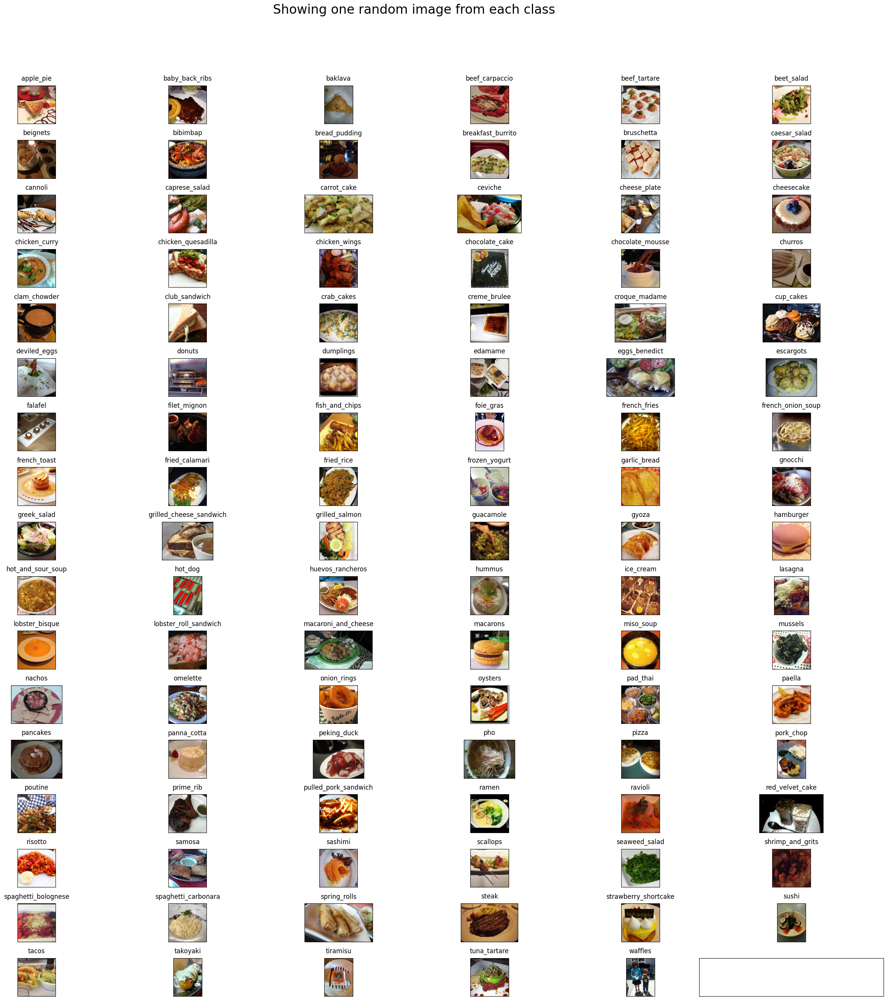

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
# Visualize the data, showing one image per class from 101 classes
rows = 17
cols = 6
fig, ax = plt.subplots(rows, cols, figsize=(25,25))
fig.suptitle("Showing one random image from each class", y=1.05, fontsize=24) # Adding  y=1.05, fontsize=24 helped me fix the suptitle overlapping with axes issue
data_dir = "/content/drive/MyDrive/CNN project/train"
foods_sorted = sorted(os.listdir(data_dir))
food_id = 0
for i in range(rows):
  for j in range(cols):
    try:
      food_selected = foods_sorted[food_id]
      food_id += 1
    except:
      break
    if food_selected == '.DS_Store':
        continue
    food_selected_images = os.listdir(os.path.join(data_dir,food_selected)) # returns the list of all files present in each food category
    food_selected_random = np.random.choice(food_selected_images) # picks one food item from the list as choice, takes a list and returns one random item
    img = plt.imread(os.path.join(data_dir,food_selected, food_selected_random))
    ax[i][j].imshow(img)
    ax[i][j].set_title(food_selected, pad = 10)

plt.setp(ax, xticks=[],yticks=[])
plt.tight_layout()
# https://matplotlib.org/users/tight_layout_guide.html

- splitting the dataset into training and testing

In [ ]:
# Helper method to split dataset into train and test folders
def prepare_data(filepath, src,dest):
  classes_images = defaultdict(list)
  with open(filepath, 'r') as txt:
      paths = [read.strip() for read in txt.readlines()]
      for p in paths:
        food = p.split('/')
        classes_images[food[0]].append(food[1] + '.jpg')

  for food in classes_images.keys():
    print("\nCopying images into ",food)
    if not os.path.exists(os.path.join(dest,food)):
      os.makedirs(os.path.join(dest,food))
    for i in classes_images[food]:
      copy(os.path.join(src,food,i), os.path.join(dest,food,i))
  print("Copying Done!")

In [ ]:
# Prepare train dataset by copying images from food-101/images to food-101/train using the file train.txt
# %cd /content
print("Creating train data...")
prepare_data('/content/food-101/meta/train.txt', '/content/food-101/images', 'train')

Creating train data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying im

In [ ]:
# Prepare test data by copying images from food-101/images to food-101/test using the file test.txt
print("Creating test data...")
prepare_data('/content/food-101/meta/test.txt', '/content/food-101/images', 'test')

Creating test data...

Copying images into  apple_pie

Copying images into  baby_back_ribs

Copying images into  baklava

Copying images into  beef_carpaccio

Copying images into  beef_tartare

Copying images into  beet_salad

Copying images into  beignets

Copying images into  bibimbap

Copying images into  bread_pudding

Copying images into  breakfast_burrito

Copying images into  bruschetta

Copying images into  caesar_salad

Copying images into  cannoli

Copying images into  caprese_salad

Copying images into  carrot_cake

Copying images into  ceviche

Copying images into  cheesecake

Copying images into  cheese_plate

Copying images into  chicken_curry

Copying images into  chicken_quesadilla

Copying images into  chicken_wings

Copying images into  chocolate_cake

Copying images into  chocolate_mousse

Copying images into  churros

Copying images into  clam_chowder

Copying images into  club_sandwich

Copying images into  crab_cakes

Copying images into  creme_brulee

Copying ima

In [ ]:
  # Check how many files are in the train folder
print("Total number of samples in train folder")
!find train -type d -or -type f -printf '.' | wc -c


Total number of samples in train folder
75750


In [ ]:
# Check how many files are in the test folder
print("Total number of samples in test folder")
!find test -type d -or -type f -printf '.' | wc -c

Total number of samples in test folder
25250


In [ ]:
import requests

url = "https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py"
response = requests.get(url)

# Save the file
with open("helper_functions.py", "wb") as file:
    file.write(response.content)

print("Download complete.")

Download complete.


In [ ]:
# Get helper_functions.py script from course GitHub
# !wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py


from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, walk_through_dir,make_confusion_matrix,load_and_prep_image

In [ ]:
train_dir = "/content/train"
test_dir = "/content/test"

# 3. PREPROCESS THE DATA



1.   we created a preprocessing function for resizing the image (224,224)
2.   utilized the map function to apply the preprocessing function on the entire training and testing data
3. applied shuffling, batching and prefetching functions



In [ ]:
import tensorflow as tf


def preprocess_img(image, label):
    IMG_SIZE = (224, 224)

    image = tf.image.resize(image, size=IMG_SIZE)

    return image, label

# Setup data inputs
IMAGE_SHAPE = (224, 224)
BATCH_SIZE = 32

train_data = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    label_mode="categorical",
    batch_size=None,
)

test_data = tf.keras.preprocessing.image_dataset_from_directory(
    test_dir,
    label_mode="categorical",
    batch_size=None,
    shuffle = False
)


# Apply the preprocessing function
train_data = train_data.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE).\
                          shuffle(buffer_size=1000).\
                          batch(BATCH_SIZE).\
                          prefetch(buffer_size=tf.data.AUTOTUNE)

test_data = test_data.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE).\
                          batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)


Found 75750 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


# 4. INSPECTING THE TRAINING DATA

In [ ]:
train_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>

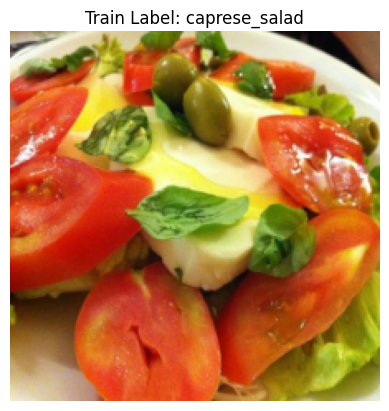

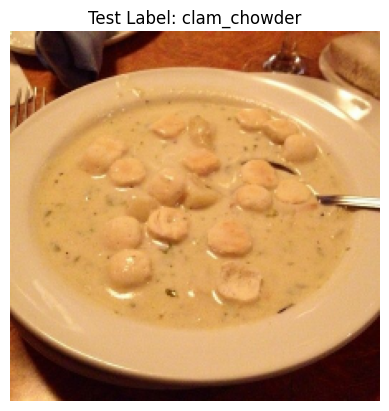

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt


def get_label_name(label_number, file_path='/content/drive/MyDrive/CNN project/food-101/meta/classes.txt'):
    with open(file_path, 'r') as f:
        label_names = f.read().splitlines()
    # Convert the label_number Tensor to a NumPy array and extract the integer value
    label_index = int(label_number.numpy())
    return label_names[label_index]

# Extract a batch of images and labels from the training set
for images, labels in train_data.take(1):
    image_copy = tf.identity(images[0])

    normalized_image = tf.cast(image_copy, tf.float32) / 255.0

    plt.imshow(normalized_image.numpy())

    # Extract the label number from the one-hot encoded labels
    label_number = tf.argmax(labels[0])
    plt.title(f"Train Label: {get_label_name(label_number)}")
    plt.axis(False)
    plt.show()

# Extract a batch of images and labels from the test set
for images, labels in test_data.take(1):
    image_copy = tf.identity(images[0])

    normalized_image = tf.cast(image_copy, tf.float32) / 255.0
    plt.imshow(normalized_image.numpy())

    # Extract the label number from the one-hot encoded labels
    label_number = tf.argmax(labels[0])
    plt.title(f"Test Label: {get_label_name(label_number)}")
    plt.axis(False)
    plt.show()


The cell below shows the shape of our images and data from the first batch


In [ ]:
# Inspect the shape of the first batch
for images, labels in train_data.take(1):
    print("Image Shape:")
    print(images.shape)
    print()
    print("Label Shape:")
    print(labels.shape)
    print()
    print("Image:")
    print(images[0])
    print()
    print("Label:")
    print(labels[0])

Image Shape:
(32, 224, 224, 3)

Label Shape:
(32, 101)

Image:
tf.Tensor(
[[[28.269772   34.116074   32.1875    ]
  [34.21811    40.04719    38.11862   ]
  [39.918365   45.77551    43.84694   ]
  ...
  [33.61339    46.095547   56.64909   ]
  [26.30801    39.254436   48.19767   ]
  [33.89429    46.89429    54.94594   ]]

 [[ 1.8609692   5.2480865   4.2480865 ]
  [ 2.5803568   5.6403055   4.6403055 ]
  [ 5.1077805   8.575892    7.5758924 ]
  ...
  [34.59747    46.796455   57.3213    ]
  [29.013376   41.378174   50.089897  ]
  [32.914623   45.447792   53.15505   ]]

 [[ 0.6358418   1.7264029   1.0835458 ]
  [ 0.34885213  1.026148    0.38329092]
  [ 0.7882654   1.7640306   1.1211735 ]
  ...
  [35.098125   45.844288   56.037506  ]
  [33.09886    43.31825    52.040817  ]
  [35.22261    46.088696   52.490444  ]]

 ...

 [[92.76275    94.76275    83.76275   ]
  [92.890915   94.78377    83.8756    ]
  [96.08607    97.050354   86.938095  ]
  ...
  [94.67283    94.67283    93.63713   ]
  [95.0121

Checking the GPU Availability and comptaibility

In [ ]:
import tensorflow as tf
from tensorflow.python.client import device_lib

physical_devices = tf.config.list_physical_devices('GPU')
print("GPUs available:", physical_devices)


print(device_lib.list_local_devices())

GPUs available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 584304619276574942
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 14626652160
locality {
  bus_id: 1
  links {
  }
}
incarnation: 16238073468021254598
physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
xla_global_id: 416903419
]


# 5. TRAINING THE MODELS


##MODEL 5

1. Applied mixed precision to enhance the efficiency
2. loaded the efficientnet model and removed the output dense layer
3. defined the model architecture and used softmax as an activation layer to accommodate the 101 classes
4. utilized the tensorflow callbacks (reduced lr and early stopping)

In [ ]:
from tensorflow.keras import mixed_precision, layers
import tensorflow as tf

tf.random.set_seed(42)
mixed_precision.set_global_policy('mixed_float16')

input_shape = (224, 224, 3)
EFF_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False,weights="imagenet")
EFF_model.trainable = False
num_classes = 101

# Define the model architecture
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = EFF_model(inputs)
print(f"Shape after base_model: {x.shape}")
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
print(f"After GlobalAveragePooling2D(): {x.shape}")
outputs = tf.keras.layers.Dense( num_classes, activation='softmax', name = "output_layer")(x)
model_5 = tf.keras.Model(inputs, outputs)

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)


model_5.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])


24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Shape after base_model: (None, 7, 7, 1280)
After GlobalAveragePooling2D(): (None, 1280)


In [ ]:
history5 = model_5.fit(train_data,
                    epochs = 10,
                    steps_per_epoch=len(train_data),
                    validation_data = test_data,
                    validation_steps=int(0.25 * len(test_data)),
                    callbacks=[early_stopping, reduce_lr, create_tensorboard_callback("transfer_learning", "data augmentation")])

Saving TensorBoard log files to: transfer_learning/data augmentation/20240831-110409
Epoch 1/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 306s 114ms/step - accuracy: 0.4479 - loss: 2.4326 - val_accuracy: 0.6239 - val_loss: 1.4357 - learning_rate: 0.0010
Epoch 2/10


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


2368/2368 ━━━━━━━━━━━━━━━━━━━━ 19s 8ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.7048 - val_loss: 1.1288 - learning_rate: 0.0010
Epoch 3/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 259s 108ms/step - accuracy: 0.6415 - loss: 1.4021 - val_accuracy: 0.7487 - val_loss: 0.9738 - learning_rate: 0.0010
Epoch 4/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6997 - val_loss: 1.1065 - learning_rate: 0.0010
Epoch 5/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 302s 106ms/step - accuracy: 0.6742 - loss: 1.2455 - val_accuracy: 0.6765 - val_loss: 0.9165 - learning_rate: 0.0010
Epoch 6/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6520 - val_loss: 1.2783 - learning_rate: 0.0010
Epoch 7/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 229s 95ms/step - accuracy: 0.6966 - loss: 1.1559 - val_accuracy: 0.7481 - val_loss: 0.9324 - learning_rate: 0.0010
Epoch 8/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms

In [ ]:
model_5.evaluate(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 62s 79ms/step - accuracy: 0.6979 - loss: 1.1133


[1.021468162536621, 0.7228118777275085]

In [ ]:
predicted_probability5 = model_5.predict(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 67s 77ms/step


In [ ]:
predicted_labels5 = np.argmax(predicted_probability5, axis=-1)
predicted_labels5[:10]

array([85,  0,  0,  0,  0, 78, 31,  0,  0, 41])

In [ ]:
true_labels5 = []
for images, labels in test_data.unbatch():
  true_labels5.append(labels.numpy().argmax())
true_labels5[:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
precision5 = precision_score(true_labels5, predicted_labels5, average='weighted')
recall5 = recall_score(true_labels5, predicted_labels5, average='weighted')
f1_5 = f1_score(true_labels5, predicted_labels5, average='weighted')
print(f'Precision: {precision5}')
print(f'Recall: {recall5}')
print(f'F1 Score: {f1_5}')

Precision: 0.7310897578146293
Recall: 0.7228118811881188
F1 Score: 0.7211883975959668


In [ ]:
with open('/content/food-101/meta/labels.txt', 'r') as file:
  lines = file.readlines()
class_names = []

for line in lines:
  class_names.append(line.strip())

In [ ]:
make_confusion_matrix(
    y_true=true_labels5,
    y_pred=predicted_labels5,
    classes=class_names,
    figsize=(100, 100),
    text_size=20,
    norm=False,
    savefig=True
)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir "transfer_learning/data augmentation/20240831-110409"

<IPython.core.display.Javascript object>

In [ ]:
model_5.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 101)                 │         129,381 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,307,461 (24.06 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

 Optimizer params: 258,768 (1010.82 KB)

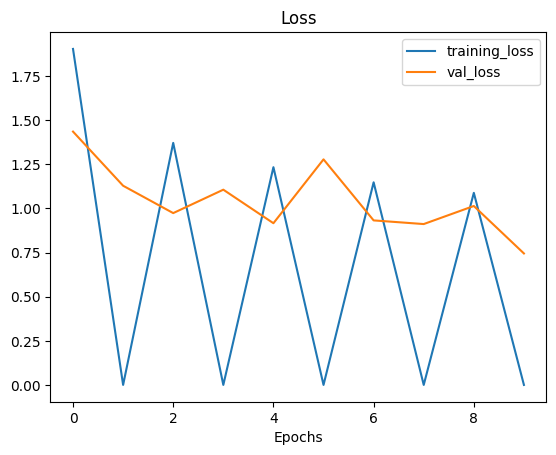

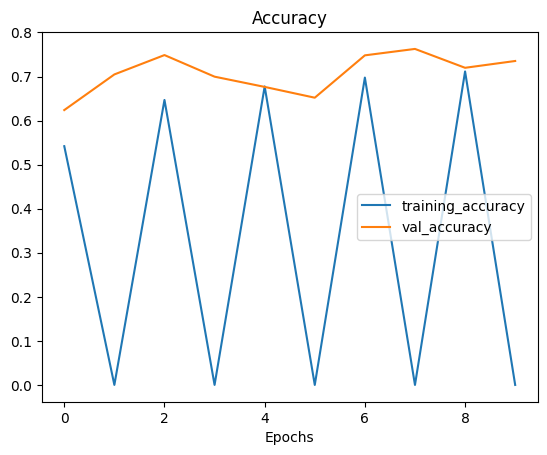

In [ ]:
plot_loss_curves(history5)

In [ ]:
model_5_layers = model_5.layers
model_5_layers

[<InputLayer name=input_layer, built=True>,
 <Functional name=efficientnetv2-b0, built=True>,
 <GlobalAveragePooling2D name=global_average_pooling_layer, built=True>,
 <Dense name=output_layer, built=True>]

In [ ]:
model_5_layers[1].layers, model_5_layers[1].trainable

([<InputLayer name=input_layer_3, built=True>,
  <Rescaling name=rescaling_2, built=True>,
  <Normalization name=normalization_2, built=True>,
  <Conv2D name=stem_conv, built=True>,
  <BatchNormalization name=stem_bn, built=True>,
  <Activation name=stem_activation, built=True>,
  <Conv2D name=block1a_project_conv, built=True>,
  <BatchNormalization name=block1a_project_bn, built=True>,
  <Activation name=block1a_project_activation, built=True>,
  <Conv2D name=block2a_expand_conv, built=True>,
  <BatchNormalization name=block2a_expand_bn, built=True>,
  <Activation name=block2a_expand_activation, built=True>,
  <Conv2D name=block2a_project_conv, built=True>,
  <BatchNormalization name=block2a_project_bn, built=True>,
  <Conv2D name=block2b_expand_conv, built=True>,
  <BatchNormalization name=block2b_expand_bn, built=True>,
  <Activation name=block2b_expand_activation, built=True>,
  <Conv2D name=block2b_project_conv, built=True>,
  <BatchNormalization name=block2b_project_bn, built=Tru

In [ ]:
with open('/content/food-101/meta/classes.txt', 'r') as file:
  lines = file.readlines()
classes = []

for line in lines:
  classes.append(line.strip())

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


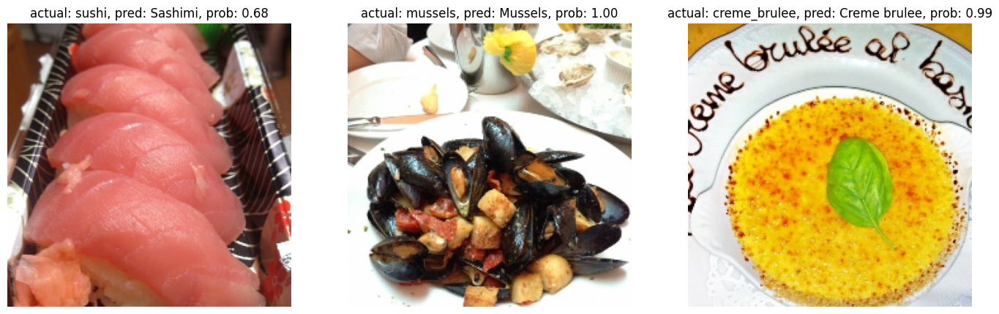

In [ ]:
plt.figure(figsize=(17, 10))
for i in range(3):


  class_name = random.choice(classes)
  filename = random.choice(os.listdir(test_dir + "/" + class_name))
  filepath = test_dir+ "/"  + class_name + "/" + filename

  img = load_and_prep_image(filepath, scale=False)
  pred_prob = model_5.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]

  plt.subplot(1, 3, i+1)
  plt.imshow(img/255.)
  plt.title(f"actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}")
  plt.axis(False);


##MODEL 4

1. Applied mixed precision to enhance the efficiency
2. loaded the efficientnet model and removed the output dense layer
3. fine-tuned the last 20 layers
4. defined the model architecture and used softmax as an activation layer to accommodate the 101 classes
5. utilized the tensorflow callbacks (reduced lr and early stopping)

In [ ]:
from tensorflow.keras import mixed_precision, layers
import tensorflow as tf

tf.random.set_seed(42)
mixed_precision.set_global_policy('mixed_float16')

input_shape = (224, 224, 3)
EFF_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
EFF_model.trainable = True

# Fine-tune from this layer onwards
for layer in EFF_model.layers[:-20]:
    layer.trainable = False

# Define the model architecture
inputs = layers.Input(shape=input_shape, name="input_layer")
x = EFF_model(inputs)
x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
outputs = layers.Dense(101, activation='softmax', name="output_layer")(x)

model_4 = tf.keras.Model(inputs, outputs)

# Compile the model with a mixed precision compatible optimizer
optimizer = tf.keras.optimizers.Adam()
optimizer = mixed_precision.LossScaleOptimizer(optimizer)
model_4.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)



24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
history4 = model_4.fit(train_data,
                    epochs = 10,
                    steps_per_epoch=len(train_data),
                    validation_data = test_data,
                    validation_steps=int(0.25 * len(test_data)),
                    callbacks=[early_stopping, reduce_lr, create_tensorboard_callback("transfer_learning", "data augmentation")])

Saving TensorBoard log files to: transfer_learning/data augmentation/20240830-223339
Epoch 1/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 300s 108ms/step - accuracy: 0.5109 - loss: 2.0318 - val_accuracy: 0.7318 - val_loss: 0.9837 - learning_rate: 0.0010
Epoch 2/10


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


2368/2368 ━━━━━━━━━━━━━━━━━━━━ 15s 7ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.7551 - val_loss: 0.8714 - learning_rate: 0.0010
Epoch 3/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 229s 95ms/step - accuracy: 0.7030 - loss: 1.1105 - val_accuracy: 0.8058 - val_loss: 0.7077 - learning_rate: 0.0010
Epoch 4/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.7548 - val_loss: 0.8388 - learning_rate: 0.0010
Epoch 5/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 241s 93ms/step - accuracy: 0.7487 - loss: 0.9220 - val_accuracy: 0.8824 - val_loss: 0.5051 - learning_rate: 0.0010
Epoch 6/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 14s 6ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.7489 - val_loss: 0.9010 - learning_rate: 0.0010
Epoch 7/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 252s 95ms/step - accuracy: 0.7848 - loss: 0.7776 - val_accuracy: 0.8057 - val_loss: 0.6939 - learning_rate: 0.0010
Epoch 8/10
2368/2368 ━━━━━━━━━━━━━━━━━━━━ 15s 6ms/s

In [ ]:
model_4.evaluate(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 62s 79ms/step - accuracy: 0.7649 - loss: 0.8378


[0.7723438143730164, 0.7834851741790771]

In [ ]:
predicted_probability = model_4.predict(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 67s 76ms/step


In [ ]:
predicted_probability[:10]

array([[5.9174e-02, 6.8235e-04, 6.7566e-02, ..., 2.3365e-05, 2.5201e-04,
        1.6922e-02],
       [7.9639e-01, 9.2983e-06, 4.2419e-03, ..., 6.3324e-04, 1.7464e-05,
        1.3757e-04],
       [2.9126e-01, 3.0208e-04, 8.7219e-02, ..., 1.1530e-03, 2.1923e-04,
        7.8058e-04],
       ...,
       [9.6680e-01, 7.1526e-07, 2.8372e-05, ..., 5.1856e-06, 1.8775e-04,
        3.5584e-05],
       [5.2100e-01, 1.3816e-04, 1.2415e-01, ..., 5.8651e-04, 3.1281e-04,
        7.9989e-05],
       [4.2847e-01, 6.5565e-07, 8.7202e-05, ..., 5.7554e-04, 4.7684e-06,
        1.4150e-04]], dtype=float16)

In [ ]:
predicted_labels = np.argmax(predicted_probability, axis=-1)
predicted_labels[:10]

array([85,  0,  0,  0,  0, 78, 29,  0,  0,  0])

In [ ]:
true_labels = []
for images, labels in test_data.unbatch(): # unbatch the test data and get images and labels
  true_labels.append(labels.numpy().argmax()) # append the index which has the largest value (labels are one-hot)

true_labels[:10] # check what labels for first 10 images look like (unshuffled)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')

In [ ]:
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')

Precision: 0.789028198989824
Recall: 0.7834851485148515
F1 Score: 0.7833788266809926


In [ ]:
len(predicted_probability), predicted_probability.shape

(25250, (25250, 101))

In [ ]:
with open('/content/food-101/meta/labels.txt', 'r') as file:
  lines = file.readlines()
class_names = []

for line in lines:
  class_names.append(line.strip())

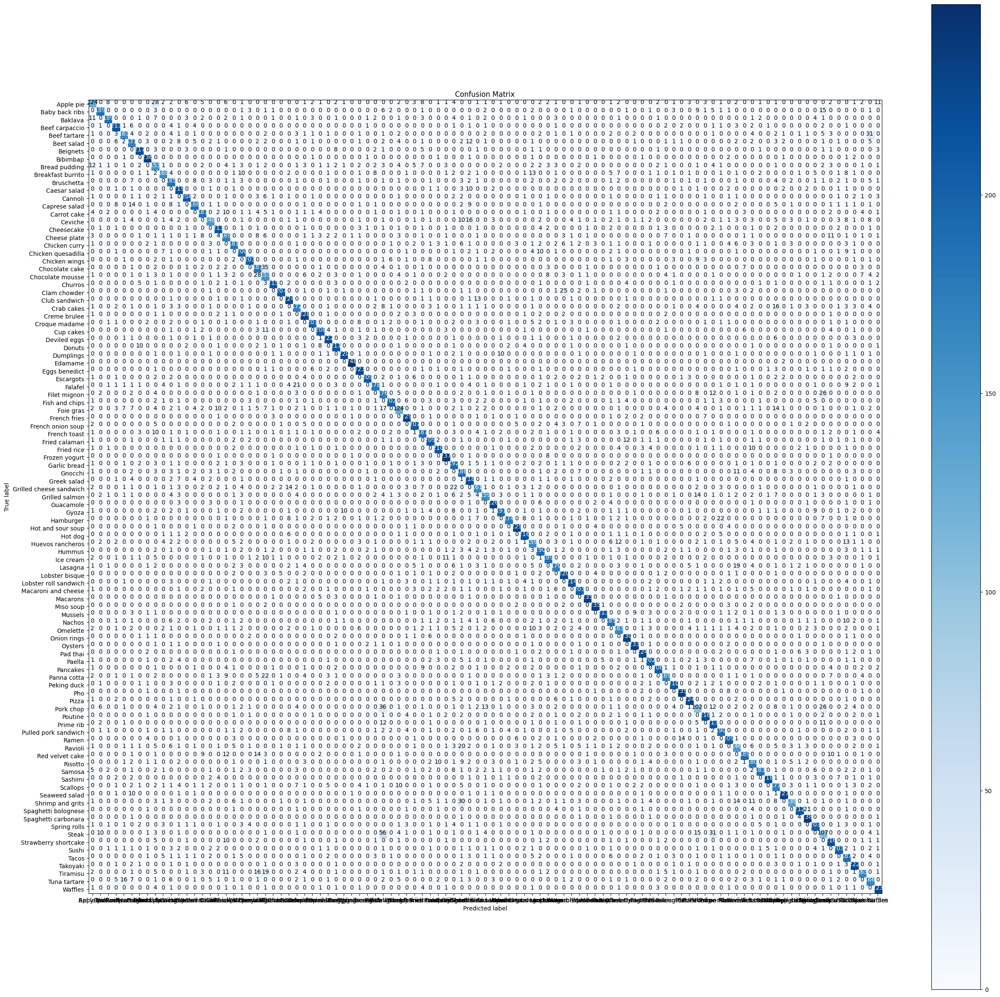

In [ ]:
make_confusion_matrix(
    y_true=true_labels,
    y_pred=predicted_labels,
    classes=class_names,
    figsize=(30, 30),
    text_size=10,
    norm=False,
    savefig=True
)